In [3]:
from PIL import Image

def merge_images(image_a_path, image_b_path, output_path):
    # 이미지 A 로드
    image_a = Image.open(image_a_path)
    
    # 이미지 B 로드
    image_b = Image.open(image_b_path)
    
    # 이미지 A와 B의 크기가 동일한지 확인
    if image_a.size != image_b.size:
        raise ValueError("이미지 A와 B의 크기가 다릅니다.")
    
    # 합쳐질 이미지 생성
    merged_image = Image.new('RGB', (image_a.width + image_b.width, image_a.height))
    
    # 이미지 A를 왼쪽에 복사
    merged_image.paste(image_a, (0, 0))
    
    # 이미지 B를 오른쪽에 복사
    merged_image.paste(image_b, (image_a.width, 0))
    
    # 합쳐진 이미지 저장
    merged_image.save(output_path)

In [99]:
import os
import xml.etree.ElementTree as ET

def adjust_bbox_coordinates(bbox, width_diff):
    # 바운딩 박스 좌표를 조정하는 함수
    xmin = int(bbox.find('xmin').text)
    xmax = int(bbox.find('xmax').text)

    bbox.find('xmin').text = str(xmin + width_diff)
    bbox.find('xmax').text = str(xmax + width_diff)

def merge_xml_files(xml_a_path, xml_b_path, output_path, new_filename):
    # XML 파일 A 로드
    tree_a = ET.parse(xml_a_path)
    root_a = tree_a.getroot()

    # XML 파일 B 로드
    tree_b = ET.parse(xml_b_path)
    root_b = tree_b.getroot()

    # 이미지 B 파일명 추출
    filename_b = root_b.find('filename').text

    # 이미지 A의 가로 크기와 이미지 B의 가로 크기 계산
    width_a = int(root_a.find('size/width').text)
    width_b = int(root_b.find('size/width').text)
    width_diff = width_a

    # 이미지 B의 바운딩 박스들에 대해 좌표 조정
    for obj in root_b.findall('object'):
        adjust_bbox_coordinates(obj.find('bndbox'), width_diff)
        # 이미지 A에 있는 모든 bbox를 가져와서 새로운 Element 객체로 추가
        root_a.append(obj)

    # 이미지 B를 이미지 A 오른쪽에 합치기
    root_a.find('filename').text = new_filename + '.jpg'
    root_a.find('size/width').text = str(width_a + width_b)

    # 새로운 XML 파일 저장
    tree_a.write(output_path, encoding='utf-8')

In [ ]:
# 예시 사용법
merge_xml_files('image_a.xml', 'image_b.xml', 'merged_image.xml', 'new_image')

In [1]:
# 예시 사용법
merge_images('image_a.jpg', 'image_b.jpg', 'merged_image.jpg')

FileNotFoundError: [Errno 2] No such file or directory: 'image_a.jpg'

## 이미지 불러오기

In [5]:
import os

In [6]:
img_list = os.listdir('./snack-data-to50/train/resize_img_all/')

In [9]:
img_list

['10091_0_m_1.jpg',
 '10091_0_m_10.jpg',
 '10091_0_m_11.jpg',
 '10091_0_m_12.jpg',
 '10091_0_m_14.jpg',
 '10091_0_m_15.jpg',
 '10091_0_m_16.jpg',
 '10091_0_m_17.jpg',
 '10091_0_m_19.jpg',
 '10091_0_m_2.jpg',
 '10091_0_m_20.jpg',
 '10091_0_m_21.jpg',
 '10091_0_m_22.jpg',
 '10091_0_m_23.jpg',
 '10091_0_m_24.jpg',
 '10091_0_m_3.jpg',
 '10091_0_m_4.jpg',
 '10091_0_m_5.jpg',
 '10091_0_m_7.jpg',
 '10091_0_m_9.jpg',
 '10091_0_s_1.jpg',
 '10091_0_s_12.jpg',
 '10091_0_s_14.jpg',
 '10091_0_s_16.jpg',
 '10091_0_s_17.jpg',
 '10091_0_s_18.jpg',
 '10091_0_s_19.jpg',
 '10091_0_s_2.jpg',
 '10091_0_s_20.jpg',
 '10091_0_s_21.jpg',
 '10091_0_s_22.jpg',
 '10091_0_s_23.jpg',
 '10091_0_s_3.jpg',
 '10091_0_s_4.jpg',
 '10091_0_s_5.jpg',
 '10091_0_s_6.jpg',
 '10091_0_s_8.jpg',
 '10091_0_s_9.jpg',
 '10091_30_m_1.jpg',
 '10091_30_m_10.jpg',
 '10091_30_m_12.jpg',
 '10091_30_m_13.jpg',
 '10091_30_m_14.jpg',
 '10091_30_m_16.jpg',
 '10091_30_m_19.jpg',
 '10091_30_m_2.jpg',
 '10091_30_m_20.jpg',
 '10091_30_m_21.jpg',

In [31]:
merge_images('./snack-data-to50/train/resize_img_all/' +img_list[100], './snack-data-to50/train/resize_img_all/' + img_list[1000] , 'merged_image2.jpg')

In [12]:
xml_list = os.listdir('./snack-data-to50/train/resize_rename_label_all/')

In [16]:
xml_list.sort()

In [20]:
xml_list[:3]

['10091_0_m_1.xml', '10091_0_m_10.xml', '10091_0_m_10_meta.xml']

In [23]:
len(xml_list), len(xml_lis)

(11400, 5700)

In [49]:
merge_xml_files('./snack-data-to50/train/resize_rename_label_all/'+xml_lis[100], './snack-data-to50/train/resize_rename_label_all/'+xml_lis[1000], 'merged_image4.xml', 'new_image2')

In [25]:
import xml.etree.ElementTree as ET
import xml.dom.minidom as minidom

def prettify_xml(xml_string):
    parsed_xml = minidom.parseString(xml_string)
    return parsed_xml.toprettyxml(indent="    ")

def read_and_print_xml(xml_file):
    try:
        tree = ET.parse(xml_file)
        root = tree.getroot()
        xml_string = ET.tostring(root, encoding='utf-8')
        pretty_xml = prettify_xml(xml_string)
        print(pretty_xml)
    except Exception as e:
        print("Error:", e)

In [26]:
# 예시 사용법
xml_file_path = './merged_image.xml'
read_and_print_xml(xml_file_path)

<?xml version="1.0" ?>
<annotation>
    <folder>/119.상품 이미지 데이터/01.데이터/1.Training/원천데이터/과자/10091_꼬깔콘고소한맛72G/</folder>
    <filename>new_image.jpg</filename>
    <path>/119.상품 이미지 데이터/01.데이터/1.Training/원천데이터/과자/10091_꼬깔콘고소한맛72G/10091_0_m_1.jpg</path>
    <source>
        <database>Unknown</database>
    </source>
    <size>
        <width>1000</width>
        <height>1000</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>10091</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <difficult>0</difficult>
        <bndbox>
            <xmin>119</xmin>
            <ymin>262</ymin>
            <xmax>501</xmax>
            <ymax>744</ymax>
        </bndbox>
    </object>
    <object>
        <name>10091</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <difficult>0</difficult>
        <bndbox>
            <xmin>409</xmin>
            <ymin>299</ymin>
            <xmax>714</xmax>
    

In [45]:
xml_file_path = './merged_image3.xml'
read_and_print_xml(xml_file_path)

<?xml version="1.0" ?>
<annotation>
    <folder>/119.상품 이미지 데이터/01.데이터/1.Training/원천데이터/과자/10091_꼬깔콘고소한맛72G/</folder>
    <filename>new_image2.jpg</filename>
    <path>/119.상품 이미지 데이터/01.데이터/1.Training/원천데이터/과자/10091_꼬깔콘고소한맛72G/10091_60_s_15.jpg</path>
    <source>
        <database>Unknown</database>
    </source>
    <size>
        <width>2000</width>
        <height>1000</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>10091</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <difficult>0</difficult>
        <bndbox>
            <xmin>150</xmin>
            <ymin>215</ymin>
            <xmax>828</xmax>
            <ymax>837</ymax>
        </bndbox>
    </object>
    <object>
        <name>15033</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <difficult>0</difficult>
        <bndbox>
            <xmin>1055</xmin>
            <ymin>305</ymin>
            <xmax>1517</xmax>

In [33]:
from PIL import Image, ImageDraw
import xml.etree.ElementTree as ET

def read_bbox_from_xml(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    bboxes = []
    
    for obj in root.findall('object'):
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)
        bboxes.append((xmin, ymin, xmax, ymax))
    
    return bboxes

def draw_bboxes_on_image(image_path, bboxes):
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)
    
    for bbox in bboxes:
        draw.rectangle(bbox, outline='red', width=2)
    
    image.show()

In [52]:
# 예시 사용법
xml_file_path = './merged_image3.xml'
image_file_path = './merged_image2.jpg'
bboxes = read_bbox_from_xml(xml_file_path)
draw_bboxes_on_image(image_file_path, bboxes)

## 10000 장 만들기


In [56]:
img_list[:10]

['10091_0_m_1.jpg',
 '10091_0_m_10.jpg',
 '10091_0_m_11.jpg',
 '10091_0_m_12.jpg',
 '10091_0_m_14.jpg',
 '10091_0_m_15.jpg',
 '10091_0_m_16.jpg',
 '10091_0_m_17.jpg',
 '10091_0_m_19.jpg',
 '10091_0_m_2.jpg']

In [54]:
xml_list = xml_lis

In [55]:
xml_list[:10]

['10091_0_m_1.xml',
 '10091_0_m_10.xml',
 '10091_0_m_11.xml',
 '10091_0_m_12.xml',
 '10091_0_m_14.xml',
 '10091_0_m_15.xml',
 '10091_0_m_16.xml',
 '10091_0_m_17.xml',
 '10091_0_m_19.xml',
 '10091_0_m_2.xml']

In [57]:
len(img_list), len(xml_list)

(5700, 5700)

In [58]:
import random

def create_combinations(total_numbers, num_combinations):
    if num_combinations > total_numbers // 2:
        raise ValueError("Number of combinations should be less than half of the total numbers.")
    
    combinations = []
    all_numbers = list(range(total_numbers))

    for _ in range(num_combinations):
        random_combination = random.sample(all_numbers, 2)
        combinations.append(random_combination)

    return combinations

total_numbers = 5700
num_combinations = 1000
result = create_combinations(total_numbers, num_combinations)
print(result)

[[1487, 3193], [976, 358], [15, 3072], [2566, 3556], [5017, 4278], [2137, 3717], [1956, 3196], [1855, 1019], [4688, 4324], [3544, 2161], [1793, 1486], [3386, 2670], [5496, 2904], [121, 1815], [252, 1113], [4130, 196], [3432, 4858], [5070, 37], [3448, 879], [5339, 2702], [5515, 4026], [2861, 3813], [568, 5152], [546, 2852], [119, 1619], [1128, 732], [3889, 2854], [3981, 3500], [2946, 2516], [2461, 1497], [3359, 2913], [82, 161], [1292, 2914], [3507, 1947], [682, 4481], [4057, 3107], [4361, 2384], [3229, 864], [4687, 3638], [2693, 4118], [3413, 3522], [45, 1543], [3650, 2608], [3799, 2765], [3132, 2369], [364, 5199], [216, 1970], [4924, 3173], [5108, 4763], [3947, 4243], [2135, 1168], [77, 5314], [4172, 5248], [1544, 4894], [25, 3427], [2046, 5495], [1754, 46], [2345, 3758], [1738, 5249], [3209, 3722], [4320, 2331], [3647, 4963], [4172, 200], [962, 1169], [4593, 4839], [2134, 2649], [4603, 4539], [4262, 955], [1449, 40], [1583, 4055], [493, 911], [100, 1497], [5489, 3936], [401, 1736], [

In [59]:
len(result)

1000

In [61]:
img_list[result[1][1]]

'10094_0_m_5.jpg'

In [ ]:
merge_images('./snack-data-to50/train/resize_img_all/' +img_list[result[i][0]], 
             './snack-data-to50/train/resize_img_all/' + img_list[result[i[1]]] , './extra_learn/images/merged_image2.jpg')

In [62]:
import os

output_folder = './extra_learn/images/'

for i in range(len(result)):
    img_path_a = './snack-data-to50/train/resize_img_all/' + img_list[result[i][0]]
    img_path_b = './snack-data-to50/train/resize_img_all/' + img_list[result[i][1]]
    
    # 이미지를 합치는 코드 (생략)

    # 파일명 생성 (예시: 'merged_image1.jpg', 'merged_image2.jpg', ...)
    filename = f"merged_image{i+1}.jpg"
    

    # 이미지를 저장할 경로
    output_path = os.path.join(output_folder, filename)

    merge_images(img_path_a, img_path_b, filename)
# 37초 걸림

In [100]:
import os

output_folder = './extra_learn/annotation/'

for i in range(len(result)):
    xml_path_a = './snack-data-to50/train/resize_rename_label_all/' + xml_list[result[i][0]]
    xml_path_b = './snack-data-to50/train/resize_rename_label_all/' + xml_list[result[i][1]]
    
    # 이미지를 합치는 코드 (생략)

    # 파일명 생성 (예시: 'merged_image1.jpg', 'merged_image2.jpg', ...)
    filename = f"merged_label{i+1}.xml"
    name = f"merged_label{i+1}"

    # 이미지를 저장할 경로
    output_path = os.path.join(output_folder, filename)

    merge_xml_files(xml_path_a, xml_path_b, output_path, name)


In [65]:
len(result)

1000

## 확인

In [66]:
random_numbers = random.sample(range(1, 1001), 5)

In [67]:
merge_img_list = os.listdir('./extra_learn/images/')

In [70]:
merge_img_list.sort()

In [71]:
merge_label_list = os.listdir('./extra_learn/annotation/')

In [72]:
merge_label_list.sort()

In [81]:
merge_label_list[:3]

['merged_label1.xml', 'merged_label10.xml', 'merged_label100.xml']

In [82]:
merge_img_list[:3]

['.DS_Store', 'merged_image1.jpg', 'merged_image10.jpg']

In [83]:
len(merge_img_list)

1001

In [84]:
len(merge_label_list)

1000

In [74]:
import os
import xml.etree.ElementTree as ET
from PIL import Image, ImageDraw

def display_bbox(image_path, xml_path):
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)

    tree = ET.parse(xml_path)
    root = tree.getroot()

    color_dict = {}  # name에 따라 색상을 다르게 표시하기 위한 딕셔너리
    color_counter = 0

    for obj in root.findall('object'):
        name = obj.find('name').text
        if name not in color_dict:
            color_dict[name] = 'hsl({}, 100%, 50%)'.format(color_counter * 137)  # 색상을 다르게 표시
            color_counter += 1

        bndbox = obj.find('bndbox')
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)

        draw.rectangle([xmin, ymin, xmax, ymax], outline=color_dict[name], width=2)

    image.show()

    # name 출력
    print("Name:")
    for obj in root.findall('object'):
        name = obj.find('name').text
        print(name)

In [75]:
for i in random_numbers:
    image_path = './extra_learn/images/'+merge_img_list[i]
    xml_path = './extra_learn/annotation/'+merge_label_list[i]
    display_bbox(image_path, xml_path)

Name:
65727
65727
10091
Name:
30120
65723
65723
Name:
30152
10178
10178
Name:
65890
45222
45222
Name:
65727
65727
30120
30120
30120


In [78]:
import os
import xml.etree.ElementTree as ET
from PIL import Image, ImageDraw
import IPython.display as display

def display_bbox_in_notebook(image_path, xml_path):
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)

    tree = ET.parse(xml_path)
    root = tree.getroot()

    color_dict = {}  # name에 따라 색상을 다르게 표시하기 위한 딕셔너리
    color_counter = 0

    for obj in root.findall('object'):
        name = obj.find('name').text
        if name not in color_dict:
            color_dict[name] = 'hsl({}, 100%, 50%)'.format(color_counter * 137)  # 색상을 다르게 표시
            color_counter += 1

        bndbox = obj.find('bndbox')
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)

        draw.rectangle([xmin, ymin, xmax, ymax], outline=color_dict[name], width=2)

    display.display(image)

    # name 출력
    print("Name:")
    for obj in root.findall('object'):
        name = obj.find('name').text
        print(name)

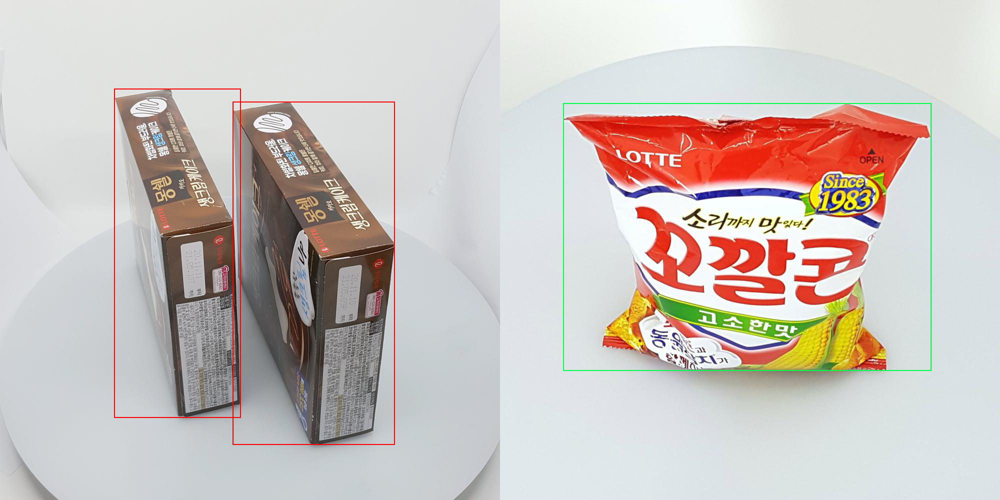

Name:
65727
65727
10091


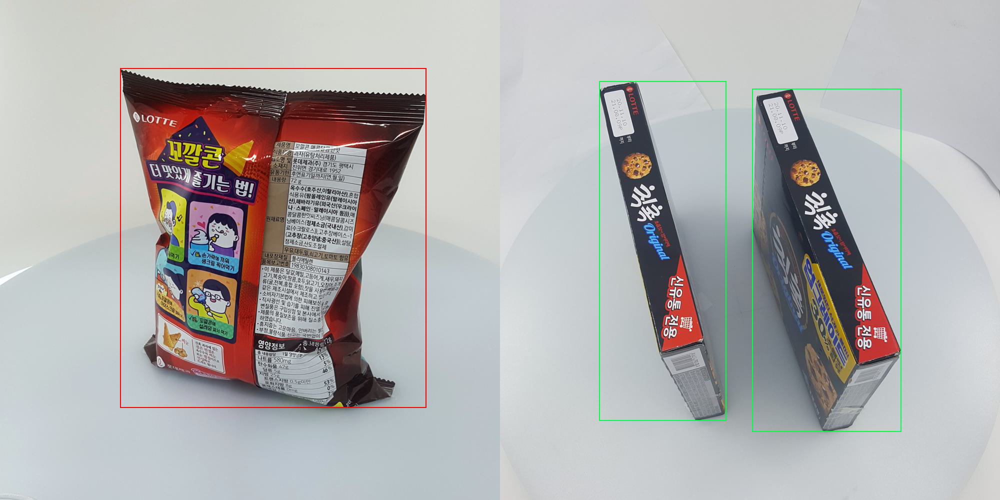

Name:
30120
65723
65723


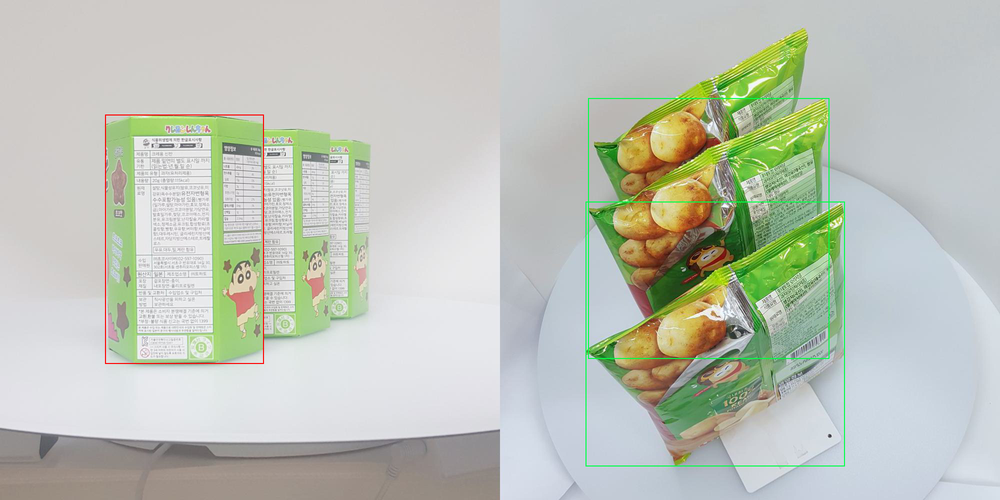

Name:
30152
10178
10178


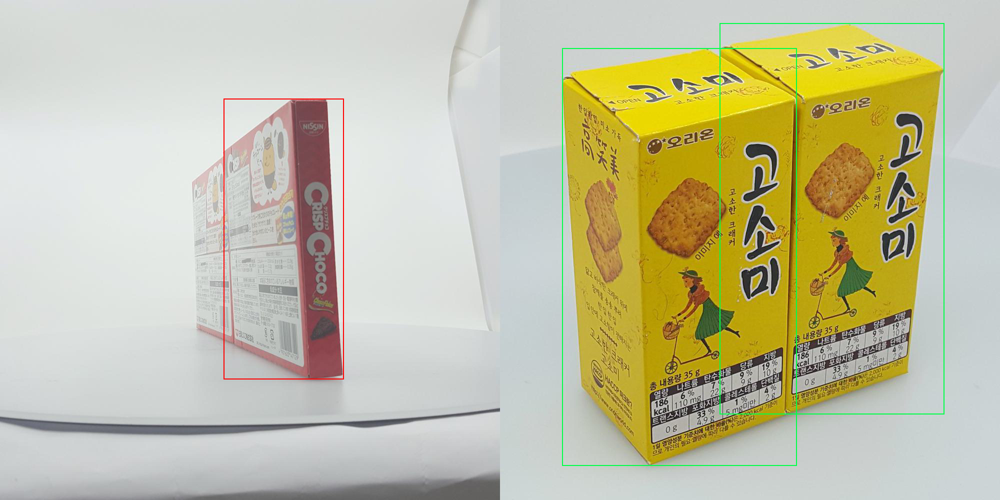

Name:
65890
45222
45222


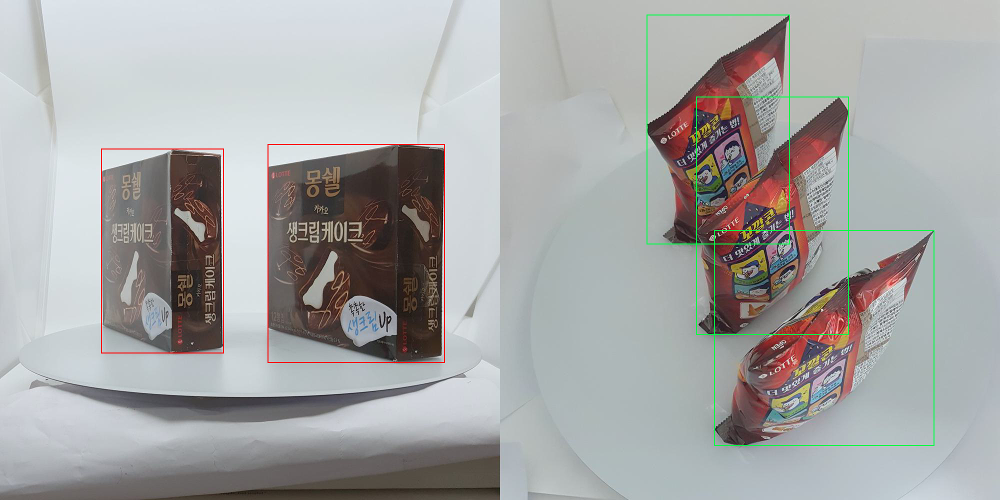

Name:
65727
65727
30120
30120
30120


In [98]:
for i in random_numbers:
    image_path = './extra_learn/images/'+merge_img_list[i]
    xml_path = './extra_learn/annotation/'+merge_label_list[i]
    display_bbox_in_notebook(image_path, xml_path)

In [88]:
merge_label_list[random_numbers[2]]

'merged_label452.xml'

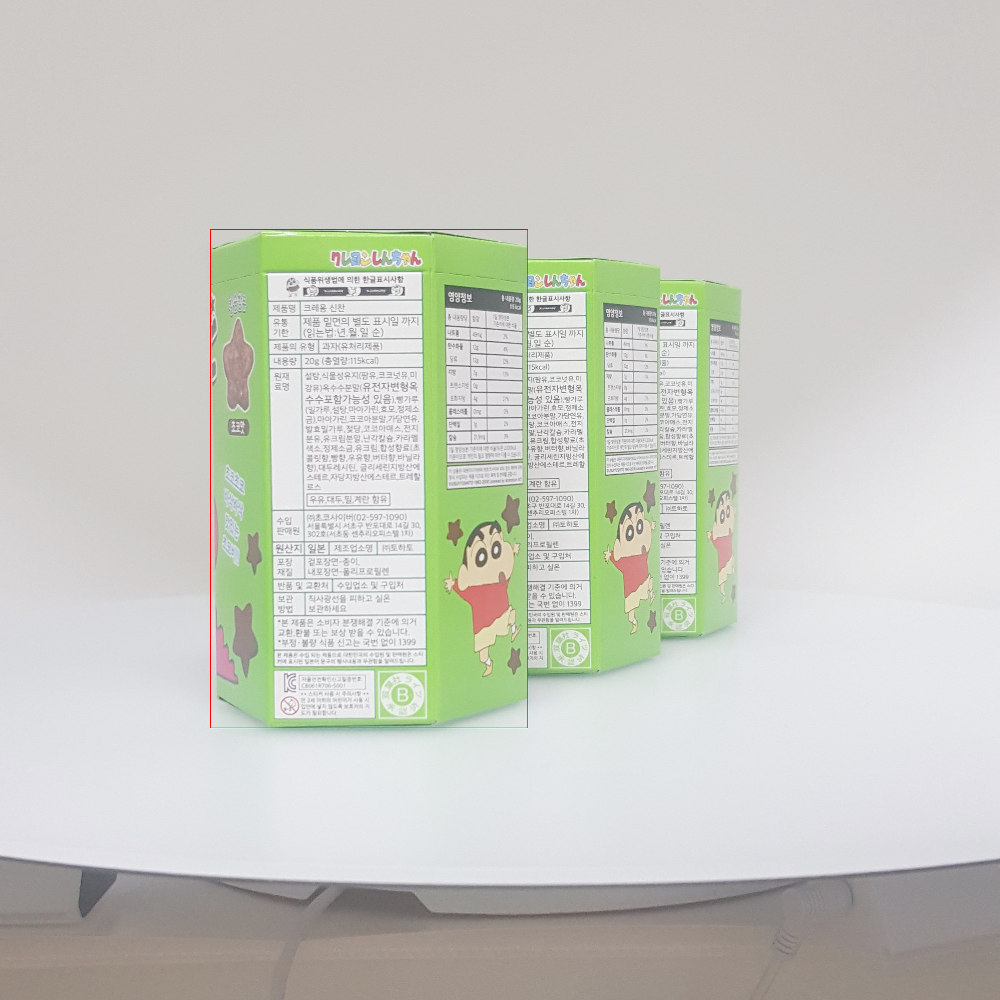

Name:
30152


In [103]:
display_bbox_in_notebook('./etcdata/정리용_이미지/30152_토하토)크레용신찬20G/30152_00_m_9.jpg', './etcdata/[원천]정리용_라벨/30152_토하토)크레용신찬20G/30152_00_m_9.xml')

In [94]:
random_numbers

[555, 873, 393, 925, 727]

In [95]:
merge_label_list[random_numbers[2]]

'merged_label452.xml'

In [101]:
read_and_print_xml('./extra_learn/annotation/merged_label452.xml')

<?xml version="1.0" ?>
<annotation>
    <folder>/119.상품 이미지 데이터/01.데이터/1.Training/원천데이터/과자/30152_토하토)크레용신찬20G/</folder>
    <filename>merged_label452.jpg</filename>
    <path>/119.상품 이미지 데이터/01.데이터/1.Training/원천데이터/과자/30152_토하토)크레용신찬20G/30152_00_m_9.jpg</path>
    <source>
        <database>Unknown</database>
    </source>
    <size>
        <width>2000</width>
        <height>1000</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>30152</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <difficult>0</difficult>
        <bndbox>
            <xmin>210</xmin>
            <ymin>229</ymin>
            <xmax>527</xmax>
            <ymax>727</ymax>
        </bndbox>
    </object>
    <object>
        <name>10178</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <difficult>0</difficult>
        <bndbox>
            <xmin>1171</xmin>
            <ymin>403</ymin>
            <xmax>168

In [104]:
read_and_print_xml('./etcdata/[원천]정리용_라벨/30152_토하토)크레용신찬20G/30152_00_m_9.xml')

<?xml version="1.0" ?>
<annotation>
    <folder>/119.상품 이미지 데이터/01.데이터/1.Training/원천데이터/과자/30152_토하토)크레용신찬20G/</folder>
    <filename>30152_00_m_9.jpg</filename>
    <path>/119.상품 이미지 데이터/01.데이터/1.Training/원천데이터/과자/30152_토하토)크레용신찬20G/30152_00_m_9.jpg</path>
    <source>
        <database>Unknown</database>
    </source>
    <size>
        <width>2988</width>
        <height>2988</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>30152</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <difficult>0</difficult>
        <bndbox>
            <xmin>628</xmin>
            <ymin>685</ymin>
            <xmax>1577</xmax>
            <ymax>2175</ymax>
        </bndbox>
    </object>
</annotation>

